In [1]:
import pandas as pd
from matplotlib import cm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from matplotlib.colors import ListedColormap, BoundaryNorm
import pydot
import pydotplus
import re
import numpy
import seaborn as sn
from sklearn import neighbors
import matplotlib.patches as mpatches
import graphviz
from sklearn.tree import export_graphviz
import matplotlib.patches as mpatches

# Plot Functions

In [2]:
def plot_decision_tree(clf, feature_names, class_names):
    # This function requires the pydotplus module and assumes it's been installed.
    # In some cases (typically under Windows) even after running conda install, there is a problem where the
    # pydotplus module is not found when running from within the notebook environment.  The following code
    # may help to guarantee the module is installed in the current notebook environment directory.
    #
    # import sys; sys.executable
    # !{sys.executable} -m pip install pydotplus

    export_graphviz(clf, out_file="adspy_temp.dot", feature_names=feature_names, class_names=class_names, filled = True, impurity = False)
    #PATH = '/Users/chieh/Desktop/Milestone II/adspy_temp.dot'
    #f = str(pydot.graph_from_dot_file(PATH))
    #f = re.sub('(\\\\nsamples = [0-9]+)(\\\\nvalue = \[([0-9]+,)+\])', '', f)
    #f = re.sub('(samples = [0-9]+)(\\\\nvalue = \[([0-9]+,)+\])\\\\n', '', f)

    #with open('adspy_temp.dot', 'w') as file:
    #    dot_graph = file.write(f)
    with open("adspy_temp.dot") as f:
        dot_graph = f.read()
    # Alternate method using pydotplus, if installed.
    #graph = pydotplus.graphviz.graph_from_dot_data(dot_graph)
    #return graph.create_png()
    return graphviz.Source(dot_graph)

def plot_feature_importances(clf, feature_names):
    c_features = len(feature_names)
    plt.barh(range(c_features), clf.feature_importances_)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature name")
    plt.yticks(numpy.arange(c_features), feature_names)

def plot_labelled_scatter(X, y, class_labels):
    num_labels = len(class_labels)

    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

    marker_array = ['o', '^', '*']
    color_array = ['#FFFF00', '#00AAFF', '#000000', '#FF00AA']
    cmap_bold = ListedColormap(color_array)
    bnorm = BoundaryNorm(numpy.arange(0, num_labels + 1, 1), ncolors=num_labels)
    plt.figure()

    plt.scatter(X[:, 0], X[:, 1], s=65, c=y, cmap=cmap_bold, norm = bnorm, alpha = 0.40, edgecolor='black', lw = 1)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    h = []
    for c in range(0, num_labels):
        h.append(mpatches.Patch(color=color_array[c], label=class_labels[c]))
    plt.legend(handles=h)

    plt.show()


def plot_class_regions_for_classifier_subplot(clf, X, y, X_test, y_test, title, subplot, target_names = None, plot_decision_regions = True):

    numClasses = numpy.amax(y) + 1
    color_list_light = ['#FFFFAA', '#EFEFEF', '#AAFFAA', '#AAAAFF']
    color_list_bold = ['#EEEE00', '#000000', '#00CC00', '#0000CC']
    cmap_light = ListedColormap(color_list_light[0:numClasses])
    cmap_bold  = ListedColormap(color_list_bold[0:numClasses])

    h = 0.03
    k = 0.5
    x_plot_adjust = 0.1
    y_plot_adjust = 0.1
    plot_symbol_size = 50

    x_min = X.iloc[:, 0].min()
    x_max = X.iloc[:, 0].max()
    y_min = X.iloc[:, 1].min()
    y_max = X.iloc[:, 1].max()
    x2, y2 = numpy.meshgrid(numpy.arange(x_min-k, x_max+k, h), numpy.arange(y_min-k, y_max+k, h))

    P = clf.predict(numpy.c_[x2.ravel(), y2.ravel()])
    P = P.reshape(x2.shape)

    if plot_decision_regions:
        subplot.contourf(x2, y2, P, cmap=cmap_light, alpha = 0.8)

    subplot.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold, s=plot_symbol_size, edgecolor = 'black')
    subplot.set_xlim(x_min - x_plot_adjust, x_max + x_plot_adjust)
    subplot.set_ylim(y_min - y_plot_adjust, y_max + y_plot_adjust)

    if (X_test is not None):
        subplot.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cmap_bold, s=plot_symbol_size, marker='^', edgecolor = 'black')
        train_score = clf.score(X, y)
        test_score  = clf.score(X_test, y_test)
        title = title + "\nTrain score = {:.2f}, Test score = {:.2f}".format(train_score, test_score)

    subplot.set_title(title)

    if (target_names is not None):
        legend_handles = []
        for i in range(0, len(target_names)):
            patch = mpatches.Patch(color=color_list_bold[i], label=target_names[i])
            legend_handles.append(patch)
        subplot.legend(loc=0, handles=legend_handles)


def plot_class_regions_for_classifier(clf, X, y, X_test=None, y_test=None, title=None, target_names = None, plot_decision_regions = True):

    numClasses = numpy.amax(y) + 1
    color_list_light = ['#FFFFAA', '#EFEFEF', '#AAFFAA', '#AAAAFF']
    color_list_bold = ['#EEEE00', '#000000', '#00CC00', '#0000CC']
    cmap_light = ListedColormap(color_list_light[0:numClasses])
    cmap_bold  = ListedColormap(color_list_bold[0:numClasses])

    h = 0.03
    k = 0.5
    x_plot_adjust = 0.1
    y_plot_adjust = 0.1
    plot_symbol_size = 50

    x_min = X.iloc[:, 0].min()
    x_max = X.iloc[:, 0].max()
    y_min = X.iloc[:, 1].min()
    y_max = X.iloc[:, 1].max()
    x2, y2 = numpy.meshgrid(numpy.arange(x_min-k, x_max+k, h), numpy.arange(y_min-k, y_max+k, h))

    P = clf.predict(numpy.c_[x2.ravel(), y2.ravel()])
    P = P.reshape(x2.shape)
    plt.figure()
    if plot_decision_regions:
        plt.contourf(x2, y2, P, cmap=cmap_light, alpha = 0.8)

    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold, s=plot_symbol_size, edgecolor = 'black')
    plt.xlim(x_min - x_plot_adjust, x_max + x_plot_adjust)
    plt.ylim(y_min - y_plot_adjust, y_max + y_plot_adjust)

    if (X_test is not None):
        plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cmap_bold, s=plot_symbol_size, marker='^', edgecolor = 'black')
        train_score = clf.score(X, y)
        test_score  = clf.score(X_test, y_test)
        title = title + "\nTrain score = {:.2f}, Test score = {:.2f}".format(train_score, test_score)

    if (target_names is not None):
        legend_handles = []
        for i in range(0, len(target_names)):
            patch = mpatches.Patch(color=color_list_bold[i], label=target_names[i])
            legend_handles.append(patch)
        plt.legend(loc=0, handles=legend_handles)

    if (title is not None):
        plt.title(title)
    plt.show()

def plot_fruit_knn(X, y, n_neighbors, weights):
    X_mat = X[['height', 'width']].as_matrix()
    y_mat = y.as_matrix()

    # Create color maps
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF','#AFAFAF'])
    cmap_bold  = ListedColormap(['#FF0000', '#00FF00', '#0000FF','#AFAFAF'])

    clf = neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
    clf.fit(X_mat, y_mat)

    # Plot the decision boundary by assigning a color in the color map
    # to each mesh point.

    mesh_step_size = .01  # step size in the mesh
    plot_symbol_size = 50

    x_min, x_max = X_mat[:, 0].min() - 1, X_mat[:, 0].max() + 1
    y_min, y_max = X_mat[:, 1].min() - 1, X_mat[:, 1].max() + 1
    xx, yy = numpy.meshgrid(numpy.arange(x_min, x_max, mesh_step_size),
                         numpy.arange(y_min, y_max, mesh_step_size))
    Z = clf.predict(numpy.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot training points
    plt.scatter(X_mat[:, 0], X_mat[:, 1], s=plot_symbol_size, c=y, cmap=cmap_bold, edgecolor = 'black')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())

    patch0 = mpatches.Patch(color='#FF0000', label='apple')
    patch1 = mpatches.Patch(color='#00FF00', label='mandarin')
    patch2 = mpatches.Patch(color='#0000FF', label='orange')
    patch3 = mpatches.Patch(color='#AFAFAF', label='lemon')
    plt.legend(handles=[patch0, patch1, patch2, patch3])


    plt.xlabel('height (cm)')
    plt.ylabel('width (cm)')

    plt.show()

def plot_two_class_knn(X, y, n_neighbors, weights, X_test, y_test):
    X_mat = X
    y_mat = y

    # Create color maps
    cmap_light = ListedColormap(['#FFFFAA', '#AAFFAA', '#AAAAFF','#EFEFEF'])
    cmap_bold  = ListedColormap(['#FFFF00', '#00FF00', '#0000FF','#000000'])

    clf = neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
    clf.fit(X_mat, y_mat)

    # Plot the decision boundary by assigning a color in the color map
    # to each mesh point.

    mesh_step_size = .01  # step size in the mesh
    plot_symbol_size = 50

    x_min, x_max = X_mat.iloc[:, 0].min() - 1, X_mat.iloc[:, 0].max() + 1
    y_min, y_max = X_mat.iloc[:, 1].min() - 1, X_mat.iloc[:, 1].max() + 1
    xx, yy = numpy.meshgrid(numpy.arange(x_min, x_max, mesh_step_size),
                         numpy.arange(y_min, y_max, mesh_step_size))
    Z = clf.predict(numpy.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot training points
    plt.scatter(X_mat[:, 0], X_mat[:, 1], s=plot_symbol_size, c=y, cmap=cmap_bold, edgecolor = 'black')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())

    title = "Neighbors = {}".format(n_neighbors)
    if (X_test is not None):
        train_score = clf.score(X_mat, y_mat)
        test_score  = clf.score(X_test, y_test)
        title = title + "\nTrain score = {:.2f}, Test score = {:.2f}".format(train_score, test_score)

    patch0 = mpatches.Patch(color='#FFFF00', label='class 0')
    patch1 = mpatches.Patch(color='#000000', label='class 1')
    plt.legend(handles=[patch0, patch1])

    plt.xlabel('Feature 0')
    plt.ylabel('Feature 1')
    plt.title(title)

    plt.show()



# Import Data

In [142]:
df = pd.read_csv('cleaned_wine.csv')
df["region_num"] = df.groupby("country_name", sort=False).ngroup()+1

In [5]:
df.columns

Index(['Unnamed: 0', 'name', 'year', 'wine ID', 'rating', 'price', 'winery',
       'winery_id', 'ratings_count', 'country_name', 'number_of_flavors',
       'black_fruit', 'citrus_fruit', 'dried_fruit', 'earth', 'floral',
       'microbio', 'non_oak', 'oak', 'red_fruit', 'spices', 'tree_fruit',
       'tropical_fruit', 'vegetal', 'region_num'],
      dtype='object')

In [6]:
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]
y = df['winery']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# Decision Tree Classifier
## classify winery

In [7]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

In [8]:
clf = DecisionTreeClassifier().fit(X_train, y_train)
print('Accuracy of Decision Tree classifier on training set: {:.2f}' .format(clf.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}' .format(clf.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 1.00
Accuracy of Decision Tree classifier on test set: 0.08


In [9]:
feature_names = ['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']
target_names = list(set(df['winery'].to_list()))
plot_decision_tree(clf, feature_names, target_names)

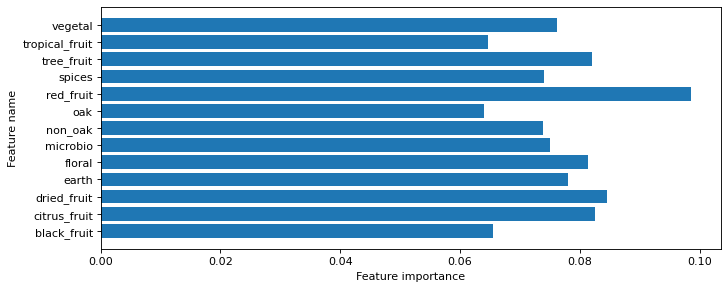

In [10]:
plt.figure(figsize=(10,4), dpi=80)
plot_feature_importances(clf, feature_names)
plt.show()

# Random Forest Classifier
## classify winery

In [11]:
from sklearn.ensemble import RandomForestClassifier


clf = RandomForestClassifier(n_estimators = 10,
                            random_state=0).fit(X_train, y_train)
print('Random Forest, Flavor dataset, default settings') 
print('Accuracy of RF classifier on training set: {:.2f}'.format(clf.score(X_train, y_train))) 
print('Accuracy of RF classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

Random Forest, Flavor dataset, default settings
Accuracy of RF classifier on training set: 1.00
Accuracy of RF classifier on test set: 0.10


# GaussianNB Classifier
## classify winery

In [12]:
from sklearn.naive_bayes import GaussianNB
    
nbclf = GaussianNB().fit(X_train, y_train)
print('Wine dataset')
print('Accuracy of GaussianNB classifier on training set: {:.2f}'
.format(nbclf.score(X_train, y_train)))
print('Accuracy of GaussianNB classifier on test set: {:.2f}'
     .format(nbclf.score(X_test, y_test)))

Wine dataset
Accuracy of GaussianNB classifier on training set: 0.61
Accuracy of GaussianNB classifier on test set: 0.04


# One Vs Rest Classifier
## classify winery

In [13]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC

clf = OneVsRestClassifier(LinearSVC(random_state=0)).fit(X_train, y_train)
print('Wine dataset')
print('Accuracy of OneVsRest classifier on training set: {:.2f}'
.format(clf.score(X_train, y_train)))
print('Accuracy of OneVsRest classifier on test set: {:.2f}'
     .format(clf.score(X_test, y_test)))

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225

Wine dataset
Accuracy of OneVsRest classifier on training set: 0.16
Accuracy of OneVsRest classifier on test set: 0.06


# Decision Tree Classifier
## classify country

In [14]:
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]
y = df['region_num']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
clf = DecisionTreeClassifier(max_depth=4).fit(X_train, y_train)
print('Accuracy of Decision Tree classifier on training set: {:.2f}' .format(clf.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}' .format(clf.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 0.65
Accuracy of Decision Tree classifier on test set: 0.61


In [15]:
#len(list(set(df['region'].to_list())))

In [16]:
feature_names = ['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']
target_names = list(set(df['country_name'].to_list()))

export_graphviz(clf, out_file="adspy_temp.dot", feature_names=feature_names, class_names=target_names, filled = True, impurity = False)

with open("adspy_temp.dot") as f:
    dot_graph = f.read()
# Alternate method using pydotplus, if installed.
my_graph = graphviz.Source(dot_graph)
my_graph.render('decision_tree_region',format='png', view=False)

'decision_tree_region.png'

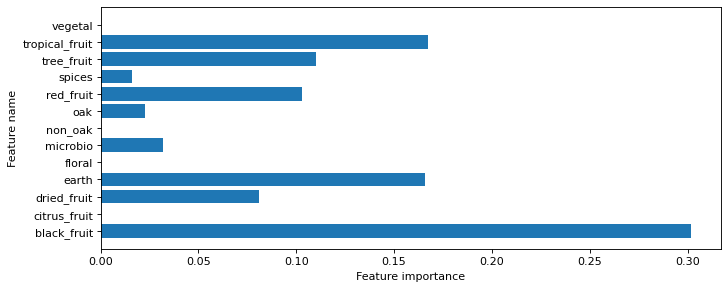

In [17]:
plt.figure(figsize=(10,4), dpi=80)
plot_feature_importances(clf, feature_names)
plt.show()

# Random Forest Classifier
## classify region

In [18]:
from sklearn.ensemble import RandomForestClassifier


clf = RandomForestClassifier(n_estimators = 10,
                            random_state=0).fit(X_train, y_train)
print('Random Forest, Flavor dataset, default settings') 
print('Accuracy of RF classifier on training set: {:.2f}'.format(clf.score(X_train, y_train))) 
print('Accuracy of RF classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

Random Forest, Flavor dataset, default settings
Accuracy of RF classifier on training set: 0.98
Accuracy of RF classifier on test set: 0.66


/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning:

could not determine class_counts_ from previously fitted classifier

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



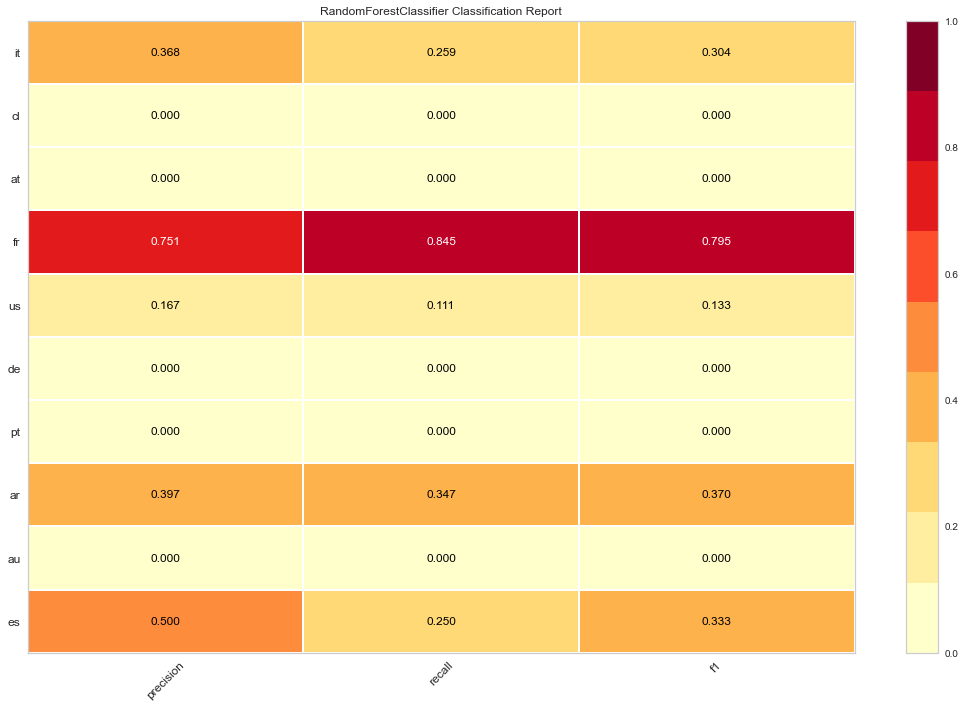

In [178]:
from sklearn.preprocessing import LabelEncoder

X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]

encoder = LabelEncoder()
y = encoder.fit_transform(df['country_name'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
model =  RandomForestClassifier(n_estimators = 10, random_state=0).fit(X_train, y_train)


report = ClassificationReport(model, size=(1080, 720), classes=list(set(df['country_name'])))

report.score(X_test, y_test)
c = report.poof()

# GaussianNB Classifier
## classify region

In [19]:
nbclf = GaussianNB().fit(X_train, y_train)
print('Wine dataset')
print('Accuracy of GaussianNB classifier on training set: {:.2f}'
.format(nbclf.score(X_train, y_train)))
print('Accuracy of GaussianNB classifier on test set: {:.2f}'
     .format(nbclf.score(X_test, y_test)))

Wine dataset
Accuracy of GaussianNB classifier on training set: 0.21
Accuracy of GaussianNB classifier on test set: 0.19


# Gradient Boosting Classifier
## classify region

In [95]:
from sklearn.ensemble import GradientBoostingClassifier
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]
y = df['country_name']
X_train, X_test, y_train, y_test = train_test_split(X, y)
clf = GradientBoostingClassifier().fit(X_train, y_train)
print('Wine dataset')
print('Accuracy of GradientBoosting classifier on training set: {:.2f}'
.format(clf.score(X_train, y_train)))
print('Accuracy of GradientBoosting classifier on test set: {:.2f}'
     .format(clf.score(X_test, y_test)))

Wine dataset
Accuracy of GradientBoosting classifier on training set: 0.87
Accuracy of GradientBoosting classifier on test set: 0.62


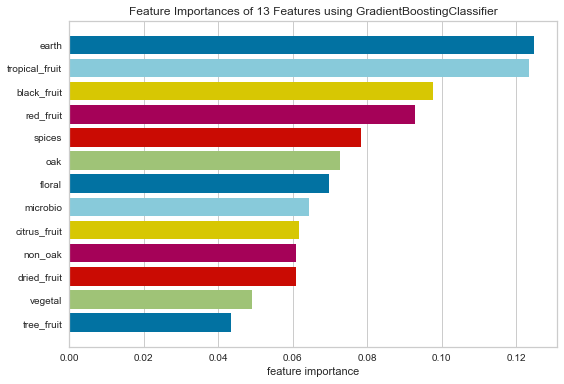

<AxesSubplot:title={'center':'Feature Importances of 13 Features using GradientBoostingClassifier'}, xlabel='feature importance'>

In [97]:
from yellowbrick.features import FeatureImportances
fig = plt.figure()
ax = fig.add_subplot()
viz = FeatureImportances(GradientBoostingClassifier(), relative=False)
viz.fit(X_train,y_train) # Fit the data to the visualizer
viz.poof() # Draw/show/poof the data

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning:

could not determine class_counts_ from previously fitted classifier

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



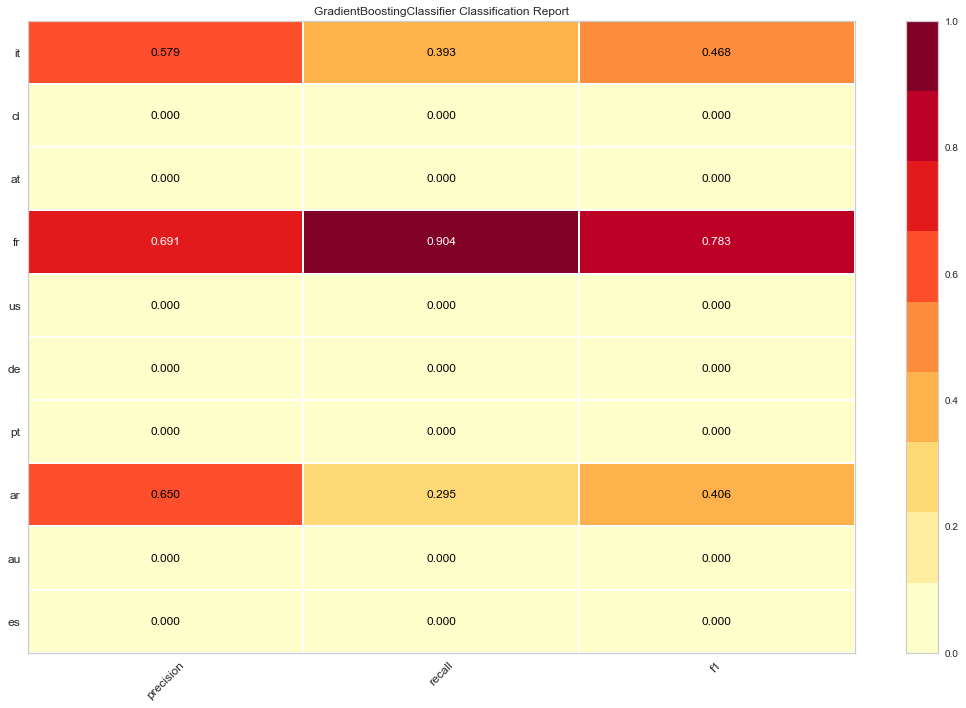

In [150]:
from sklearn.preprocessing import LabelEncoder

X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]

encoder = LabelEncoder()
y = encoder.fit_transform(df['country_name'])

model = LinearSVC()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

clf = GradientBoostingClassifier().fit(X_train, y_train)

report = ClassificationReport(clf, size=(1080, 720), classes=list(set(df['country_name'])))

report.score(X_test, y_test)
c = report.poof()

# Class Balance

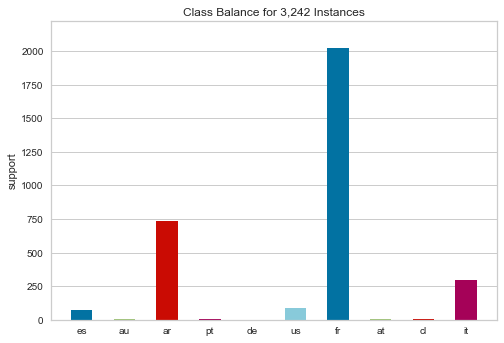

<AxesSubplot:title={'center':'Class Balance for 3,242 Instances'}, ylabel='support'>

In [53]:
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import ClassBalance, ROCAUC, ClassificationReport, ClassPredictionError

classes=list(set(df['country_name']))

visualizer = ClassBalance(labels=list(set(df['country_name'])))

visualizer.fit(y)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning:

could not determine class_counts_ from previously fitted classifier

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



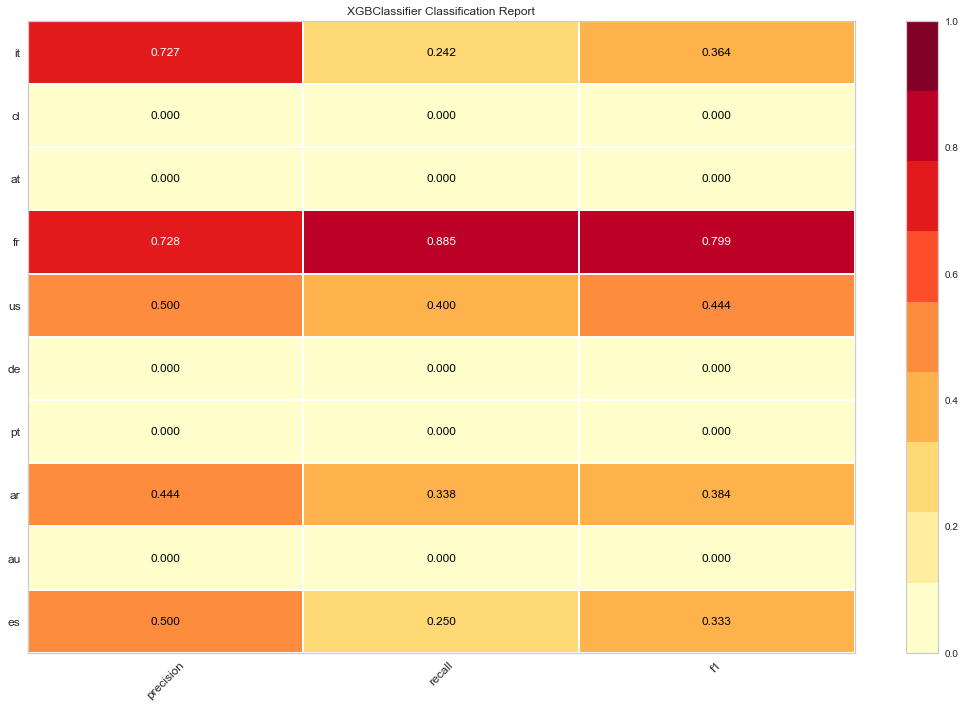

In [149]:
from sklearn.preprocessing import LabelEncoder

X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]

encoder = LabelEncoder()
y = encoder.fit_transform(df['country_name'])

model = LinearSVC()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

clf = XGBClassifier(n_jobs=-1, random_state=0,objective='multi:softprob')
clf.fit(X_train, y_train)

report = ClassificationReport(clf, size=(1080, 720), classes=classes)

report.score(X_test, y_test)
c = report.poof()

# One Vs Rest Classifier
## classify region

In [77]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC

clf = OneVsRestClassifier(LinearSVC(random_state=0)).fit(X_train, y_train)
print('Wine dataset')
print('Accuracy of OneVsRest classifier on training set: {:.2f}'
.format(clf.score(X_train, y_train)))
print('Accuracy of OneVsRest classifier on test set: {:.2f}'
     .format(clf.score(X_test, y_test)))

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Wine dataset
Accuracy of OneVsRest classifier on training set: 0.64
Accuracy of OneVsRest classifier on test set: 0.00


# Visualize all the original dimensions

In [78]:
import plotly.express as px

flavors = ['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']

fig = px.scatter_matrix(
    df,
    dimensions=flavors,
    color="country_name",
    width=1800, height=1400
)
fig.update_traces(diagonal_visible=False)
fig.show()

fig.write_html("scatter_plot_original.html")

# PCA

In [79]:
from sklearn.decomposition import PCA
import plotly.express as px
pca = PCA()
components = pca.fit_transform(df[flavors])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=df["country_name"]
)
fig.update_traces(diagonal_visible=False)
fig.show()
fig.write_html("pca.html")

In [80]:
import plotly.graph_objs as go

features = flavors
X = df[features]

pca = PCA(n_components=2)
components = pca.fit_transform(X)

loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig = px.scatter(components, x=0, y=1, color=df['country_name'])

for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
    )

fig.show()
fig.write_html("pca_flavor.html")

# Price

In [157]:
print(df['price'].quantile(0.2))
print(df['price'].quantile(0.4))
print(df['price'].quantile(0.6))
print(df['price'].quantile(0.8))

16.173299353068025
22.348559106057635
29.35698882572045
38.70115642741226


In [158]:
cut_price = ['low','medium-low', "medium",'medium-high', 'high']
cut_bins =[0,df['price'].quantile(0.2), df['price'].quantile(0.4), df['price'].quantile(0.6), df['price'].quantile(0.8),50]
df['price_segment'] = pd.cut(df['price'], bins=cut_bins, labels = cut_price)
df

,Unnamed: 0,name,year,wine ID,rating,price,winery,winery_id,ratings_count,country_name,...,non_oak,oak,red_fruit,spices,tree_fruit,tropical_fruit,vegetal,region_num,rating_segment,price_segment
0,0,Brut (Carte Jaune) Champagne N.V.,N.V.,1128385,4.3,48.470888,Veuve Clicquot,7979,120606,fr,...,0.022296,0.015372,0.001352,0.002803,0.032237,0.001434,0.004585,1,excellent,high
1,1,Impérial Brut Champagne N.V.,N.V.,1122095,4.1,45.873358,Moët & Chandon,7799,107944,fr,...,0.021539,0.014915,0.001501,0.001881,0.032980,0.001454,0.004187,1,good,high
2,2,Edizione Cinque Autoctoni N.V.,N.V.,21646,4.3,21.515389,Farnese,7892,61182,fr,...,0.019385,0.027524,0.013157,0.018061,0.000196,0.000098,0.000801,1,excellent,medium-low
3,3,Special Cuvée Brut Aÿ Champagne N.V.,N.V.,18929,4.3,45.089198,Bollinger,7747,56458,fr,...,0.042598,0.034362,0.002356,0.003808,0.049825,0.002019,0.007917,1,excellent,high
4,4,Brut (Réserve) Champagne N.V.,N.V.,1129619,4.2,38.227798,Taittinger,1285,44898,fr,...,0.038109,0.029600,0.002205,0.004009,0.046906,0.002606,0.005858,1,excellent,medium-high
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3237,3237,Medalla Malbec 2019,2019,5662688,3.9,17.162086,Trapiche,7931,421,ar,...,0.325416,0.539192,0.244656,0.294537,0.004751,0.000000,0.019002,10,not bad,medium-low
3238,3238,Reserve Syrah - Garnacha 2015,2015,5643330,3.9,11.731046,Proemio,46478,415,ar,...,0.019277,0.057831,0.024096,0.031325,0.002410,0.000000,0.004819,10,not bad,low
3239,3239,Reserva Especial Pinot Noir 2017,2017,1374725,3.8,12.966608,Maycas del Limari,14981,404,ar,...,0.089109,0.131188,0.180693,0.051980,0.007426,0.000000,0.014851,10,bad,low
3240,3240,Q Chardonnay 2020,2020,19428,3.9,23.523192,Zuccardi,7729,394,ar,...,0.200508,0.350254,0.000000,0.154822,0.258883,0.101523,0.109137,10,not bad,medium


In [167]:
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]
y = df['price_segment']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
clf = DecisionTreeClassifier().fit(X_train, y_train)
print('Accuracy of Decision Tree classifier on training set: {:.2f}' .format(clf.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}' .format(clf.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 1.00
Accuracy of Decision Tree classifier on test set: 0.27


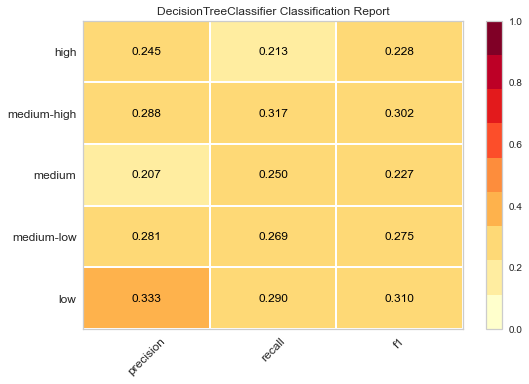

In [170]:
encoder = LabelEncoder()
y = encoder.fit_transform(df['price_segment'])

clf = DecisionTreeClassifier()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

visualizer = ClassificationReport(clf, classes=['low','medium-low', "medium",'medium-high', 'high'])
visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

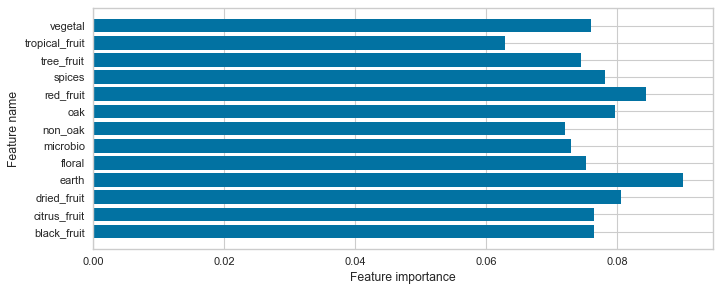

In [160]:
plt.figure(figsize=(10,4), dpi=80)
plot_feature_importances(clf, feature_names)
plt.show()

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



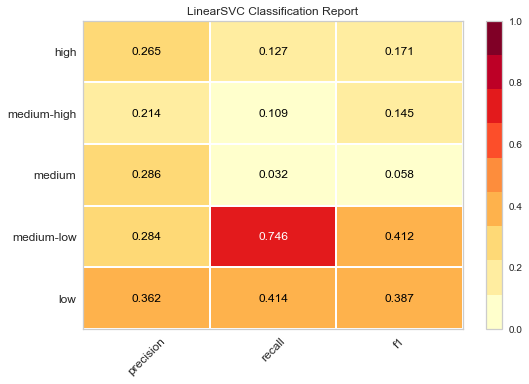

In [164]:
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]

encoder = LabelEncoder()
y = encoder.fit_transform(df['price_segment'])

model = LinearSVC()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

visualizer = ClassificationReport(model, classes=['low','medium-low', "medium",'medium-high', 'high'])
visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

In [165]:
nbclf = GaussianNB().fit(X_train, y_train)
print('Wine dataset')
print('Accuracy of GaussianNB classifier on training set: {:.2f}'
.format(nbclf.score(X_train, y_train)))
print('Accuracy of GaussianNB classifier on test set: {:.2f}'
     .format(nbclf.score(X_test, y_test)))

Wine dataset
Accuracy of GaussianNB classifier on training set: 0.24
Accuracy of GaussianNB classifier on test set: 0.22


/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but GaussianNB was fitted with feature names



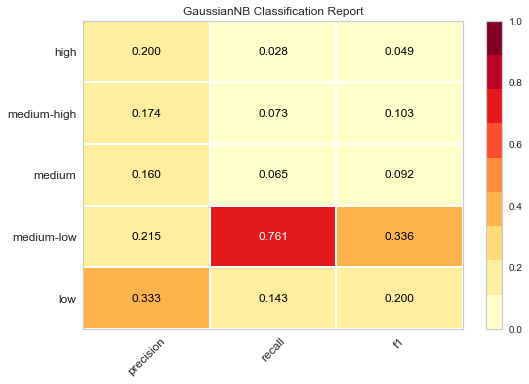

In [166]:
visualizer = ClassificationReport(nbclf, classes=['low','medium-low', "medium",'medium-high', 'high'])
visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

# Rating

In [85]:
print(df['rating'].quantile(0.25))
print(df['rating'].quantile(0.5))
print(df['rating'].quantile(0.75))

3.8
3.9
4.1


In [152]:
cut_rating = ['bad','not bad', 'good', 'excellent']
cut_bins =[0, 3.8, 3.9, 4.1, 5]
df['rating_segment'] = pd.cut(df['rating'], bins=cut_bins, labels = cut_rating)
df

,Unnamed: 0,name,year,wine ID,rating,price,winery,winery_id,ratings_count,country_name,...,microbio,non_oak,oak,red_fruit,spices,tree_fruit,tropical_fruit,vegetal,region_num,rating_segment
0,0,Brut (Carte Jaune) Champagne N.V.,N.V.,1128385,4.3,48.470888,Veuve Clicquot,7979,120606,fr,...,0.020911,0.022296,0.015372,0.001352,0.002803,0.032237,0.001434,0.004585,1,excellent
1,1,Impérial Brut Champagne N.V.,N.V.,1122095,4.1,45.873358,Moët & Chandon,7799,107944,fr,...,0.019862,0.021539,0.014915,0.001501,0.001881,0.032980,0.001454,0.004187,1,good
2,2,Edizione Cinque Autoctoni N.V.,N.V.,21646,4.3,21.515389,Farnese,7892,61182,fr,...,0.002828,0.019385,0.027524,0.013157,0.018061,0.000196,0.000098,0.000801,1,excellent
3,3,Special Cuvée Brut Aÿ Champagne N.V.,N.V.,18929,4.3,45.089198,Bollinger,7747,56458,fr,...,0.038099,0.042598,0.034362,0.002356,0.003808,0.049825,0.002019,0.007917,1,excellent
4,4,Brut (Réserve) Champagne N.V.,N.V.,1129619,4.2,38.227798,Taittinger,1285,44898,fr,...,0.030313,0.038109,0.029600,0.002205,0.004009,0.046906,0.002606,0.005858,1,excellent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3237,3237,Medalla Malbec 2019,2019,5662688,3.9,17.162086,Trapiche,7931,421,ar,...,0.083135,0.325416,0.539192,0.244656,0.294537,0.004751,0.000000,0.019002,10,not bad
3238,3238,Reserve Syrah - Garnacha 2015,2015,5643330,3.9,11.731046,Proemio,46478,415,ar,...,0.004819,0.019277,0.057831,0.024096,0.031325,0.002410,0.000000,0.004819,10,not bad
3239,3239,Reserva Especial Pinot Noir 2017,2017,1374725,3.8,12.966608,Maycas del Limari,14981,404,ar,...,0.037129,0.089109,0.131188,0.180693,0.051980,0.007426,0.000000,0.014851,10,bad
3240,3240,Q Chardonnay 2020,2020,19428,3.9,23.523192,Zuccardi,7729,394,ar,...,0.246193,0.200508,0.350254,0.000000,0.154822,0.258883,0.101523,0.109137,10,not bad


In [87]:
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]
y = df['rating_segment']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

clf = DecisionTreeClassifier().fit(X_train, y_train)
print('Accuracy of Decision Tree classifier on training set: {:.2f}' .format(clf.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}' .format(clf.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 1.00
Accuracy of Decision Tree classifier on test set: 0.30


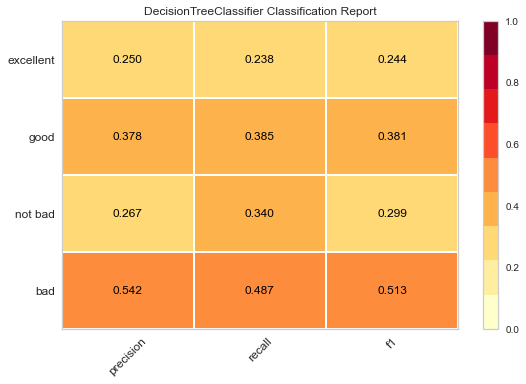

In [171]:
encoder = LabelEncoder()
y = encoder.fit_transform(df['rating_segment'])

clf = DecisionTreeClassifier()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

visualizer = ClassificationReport(clf, classes=['bad','not bad', 'good', 'excellent'])
visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

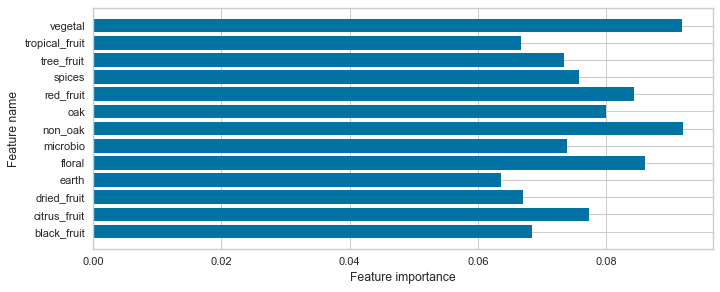

In [88]:
plt.figure(figsize=(10,4), dpi=80)
plot_feature_importances(clf, feature_names)
plt.show()

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



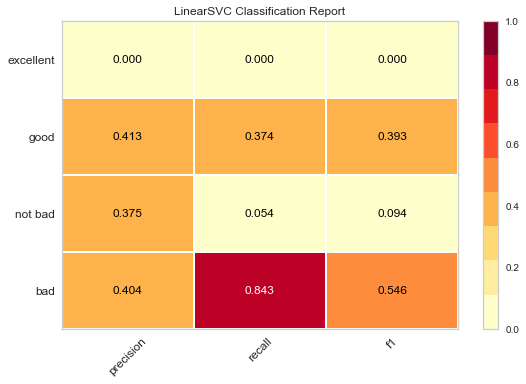

In [154]:
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]

encoder = LabelEncoder()
y = encoder.fit_transform(df['rating_segment'])

model = LinearSVC()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

visualizer = ClassificationReport(model, classes=['bad','not bad', 'good', 'excellent'])
visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

In [89]:
nbclf = GaussianNB().fit(X_train, y_train)
print('Wine dataset')
print('Accuracy of GaussianNB classifier on training set: {:.2f}'
.format(nbclf.score(X_train, y_train)))
print('Accuracy of GaussianNB classifier on test set: {:.2f}'
     .format(nbclf.score(X_test, y_test)))

Wine dataset
Accuracy of GaussianNB classifier on training set: 0.34
Accuracy of GaussianNB classifier on test set: 0.37


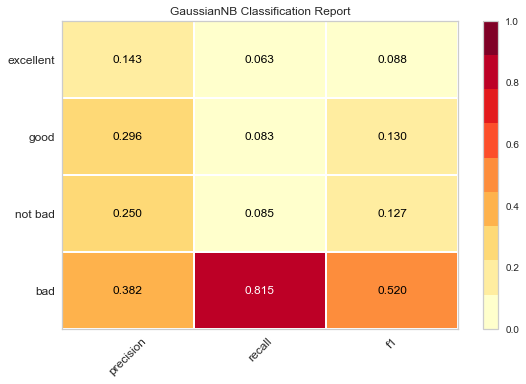

In [175]:
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]

encoder = LabelEncoder()
y = encoder.fit_transform(df['rating_segment'])

nbclf = GaussianNB()

visualizer = ClassificationReport(nbclf, classes=['bad','not bad', 'good', 'excellent'])
visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

# Yellowbrick

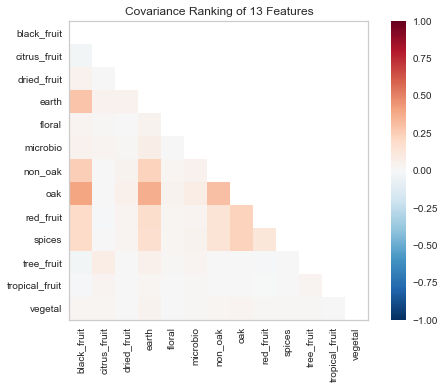

<AxesSubplot:title={'center':'Covariance Ranking of 13 Features'}>

In [92]:
from yellowbrick.features import Rank2D
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]
features=['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']
visualizer = Rank2D(features=features, algorithm='covariance')
visualizer.fit(X, df['rating_segment']) # Fit the data to the visualizer
visualizer.transform(X) # Transform the data
visualizer.poof() # Draw/show/poof the data

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/chieh/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



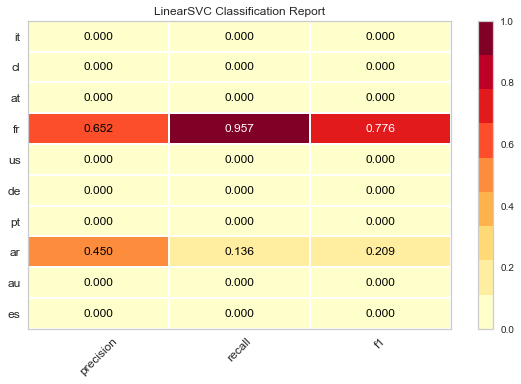

In [147]:
X = df[['black_fruit', 'citrus_fruit', 'dried_fruit', 'earth',
       'floral', 'microbio', 'non_oak', 'oak', 'red_fruit', 'spices',
       'tree_fruit', 'tropical_fruit', 'vegetal']]

encoder = LabelEncoder()
y = encoder.fit_transform(df['country_name'])

model = LinearSVC()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

visualizer = ClassificationReport(model, classes=list(set(df['country_name'])))
visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data